[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/slitvinov/dcomex-framework/blob/master/notebook/korali.ipynb)

In [1]:
%pip -qqq install --progress-bar off \
    https://github.com/slitvinov/dcomex-framework/releases/latest/download/korali-1.0-cp311-cp311-linux_x86_64.whl

ERROR: Operation cancelled by user


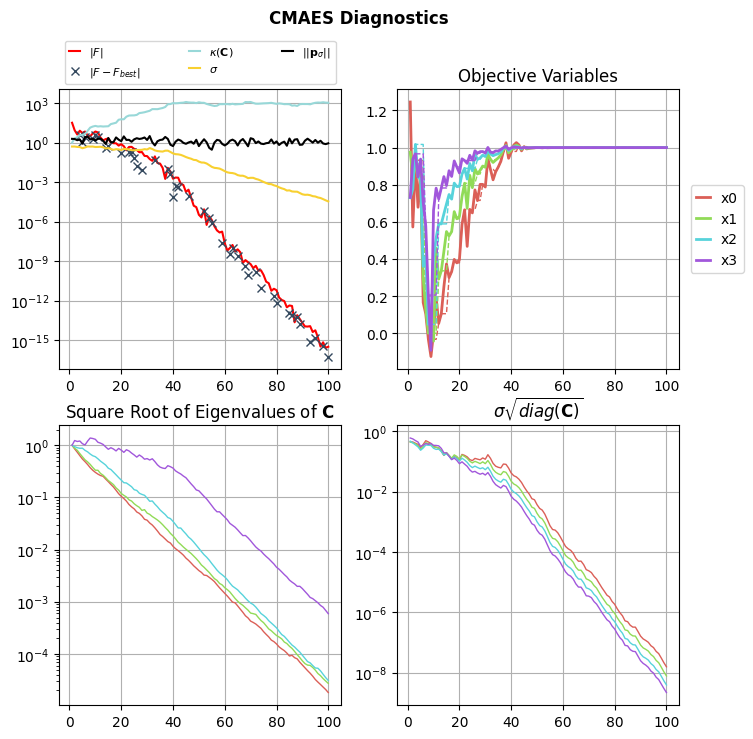

0

In [ ]:
import math
import korali
import korali.plot.__main__


def negative_rosenbrock(p):
    x = p["Parameters"]
    res = math.fsum(100 * (x - y**2)**2 + (1 - x)**2 for x, y in zip(x, x[1:]))
    p["F(x)"] = -res


k = korali.Engine()
e = korali.Experiment()
e["Random Seed"] = 0xC0FEE
e["Problem"] = {
    "Type": "Optimization",
    "Objective Function": negative_rosenbrock
}
dim = 4
for i in range(dim):
    e["Variables"][i]["Name"] = "x" + str(i)
    e["Variables"][i]["Initial Value"] = 1.0
    e["Variables"][i]["Initial Standard Deviation"] = 1.0 / math.sqrt(dim)
e["Solver"] = {
    "Type": "Optimizer/CMAES",
    "Population Size": 32,
    "Mu Value": 8,
    "Termination Criteria": {
        "Max Generations": 100
    }
}
e["File Output"] = {
    "Enabled": True,
    "Path": "_korali_result_cmaes",
    "Frequency": 1
}
k.run(e)
korali.plot.__main__.main(e["File Output"]["Path"], False, "")

posterio mean:  0.9229181632747933 2.268922385548311 0.11465524747452628
log evidence:  -1.7733178423845084


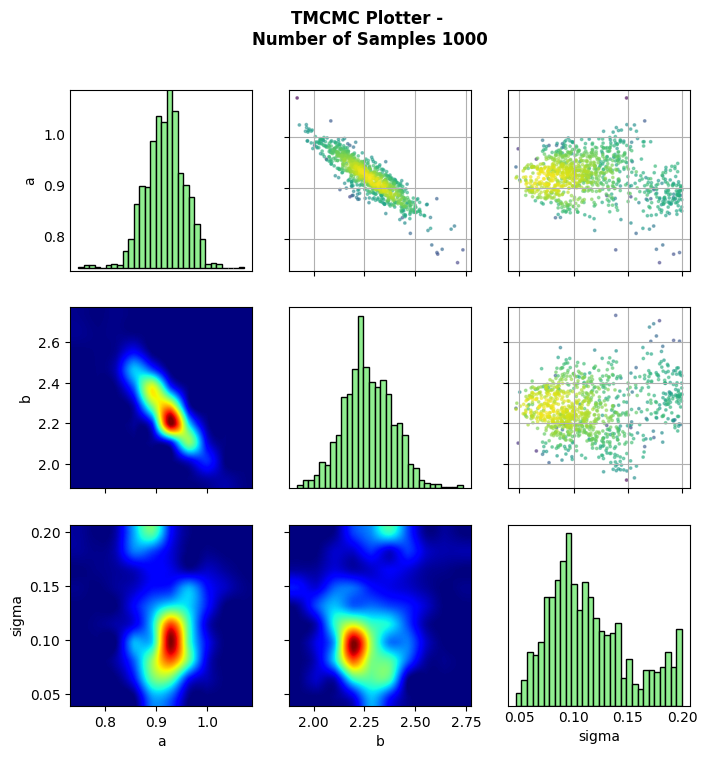

In [ ]:
import korali
import korali.plot.__main__
import statistics
import math
def model(s):
    a, b, sig = s["Parameters"]
    ssq = sig**2
    s["logLikelihood"] = -0.5 * len(x) * math.log(
        2 * math.pi * ssq) - 0.5 * statistics.fsum(
            (a * x + b - y)**2 for x, y in zip(x, y)) / ssq
x = [1.0, 2.0, 3.0, 4.0, 5.0]
y = [3.21, 4.14, 4.94, 6.06, 6.84]
e = korali.Experiment()
e["Problem"] = {"Type": "Bayesian/Custom", "Likelihood Model": model}
e["Solver"] = {"Type": "Sampler/TMCMC", "Population Size": 1000}
for i, (v, lo, hi) in enumerate(
    (("a", 0, 2), ("b", 0, 3), ("sigma", 1e-6, 0.2))):
    e["Distributions"][i] = {
        "Name": v,
        "Type": "Univariate/Uniform",
        "Minimum": lo,
        "Maximum": hi
    }
    e["Variables"][i] = {"Name": v, "Prior Distribution": v}
e["File Output"]["Path"] = "_korali_result_tmcmc"
k = korali.Engine()
k.run(e)
a, b, sig = zip(*e["Results"]["Posterior Sample Database"])
print("posterio mean: ", statistics.fmean(a), statistics.fmean(b),
      statistics.fmean(sig))
print("log evidence: ", e["Results"]["Log Evidence"])
korali.plot.__main__.main(e["File Output"]["Path"], False, "");
import json
with open("_korali_result_tmcmc/latest") as f:
    samples = json.load(f)["Results"]["Posterior Sample Database"]

best: -9.235160597795848e-25 [0.9999999999990428, 0.9999999999980587]


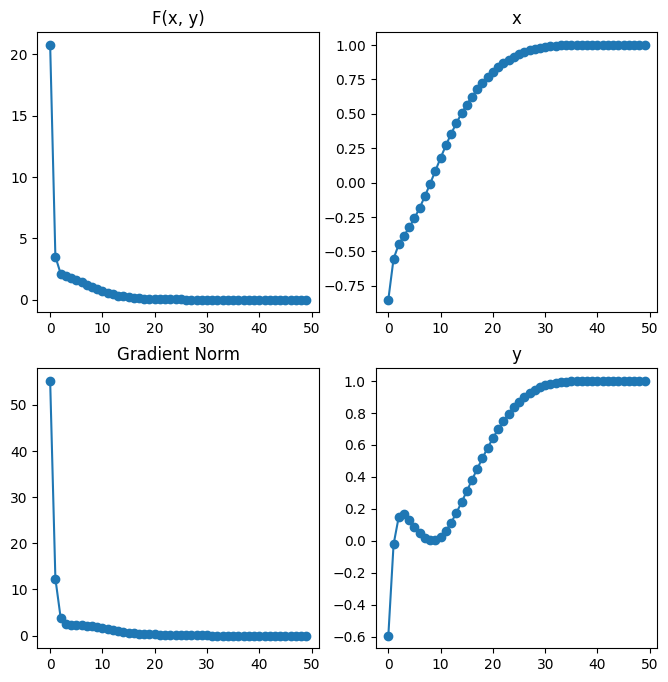

In [ ]:
import math
import korali
import json
import matplotlib.pyplot as plt
import glob
import os
def negative_rosenbrock(p):
    x = p["Parameters"]
    dim = len(x)
    grad = [0.]*dim
    a = 10
    b = 1
    p["F(x)"] = -math.fsum(a*(y-x**2)**2 + (b - x)**2 for x, y in zip(x, x[1:]))
    for i in range(dim-1):
        grad[i] += 2*(b-x[i]) + 2*a*(x[i+1]-x[i]**2)*2*x[i]
        grad[i+1] -= 2*a*(x[i+1]-x[i]**2)
    p["Gradient"] = grad
k = korali.Engine()
e = korali.Experiment()
result_dir = "_korali_result_adam"
e["Problem"]["Type"] = "Optimization"
e["Problem"]["Objective Function"] = negative_rosenbrock
for i in range(2):
    e["Variables"][i]["Name"] = "X" + str(i)
    e["Variables"][i]["Initial Value"] = -2
e["Solver"]["Type"] = "Optimizer/Adam"
e["Solver"]["Eta"] = 0.01
e["Solver"]["Termination Criteria"]["Max Generations"] = 10000
e["Console Output"]["Frequency"] = 200
e["File Output"]["Frequency"] = 200
e["File Output"]["Path"] = result_dir
k.run(e)
fs = []
grads = []
params = []
result_list = glob.glob(os.path.join(result_dir, "gen[0-9]*.json"))
result_list.sort()
for f in result_list[1:]:
  with open(f) as dat:
    dat = json.load(open(f))
    if dat["Run ID"] == e["Run ID"]:
      fs.append(-dat["Solver"]["Current Best Value"])
      params.append(dat["Solver"]["Current Variable"])
      grads.append(dat["Solver"]["Gradient Norm"])
fig, axs = plt.subplots(2, 2, figsize=(8, 8))
axs[0, 0].plot(fs, "o-")
axs[0, 0].set_title("F(x, y)")
axs[0, 1].plot([p[0] for p in params], "o-")
axs[1, 1].plot([p[1] for p in params], "o-")
axs[0, 1].set_title("x")
axs[1, 1].set_title("y")
axs[1, 0].plot(grads, "o-")
axs[1, 0].set_title("Gradient Norm")
print("best:", e["Results"]["Best Sample"]["F(x)"],
      e["Results"]["Best Sample"]["Parameters"])

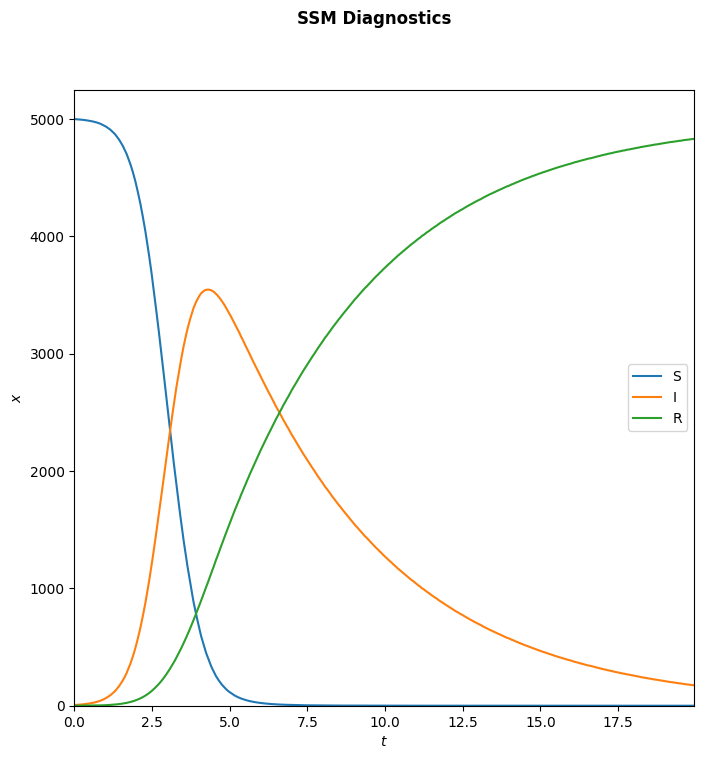

In [ ]:
import korali
import korali.plot.__main__
k = korali.Engine()
e = korali.Experiment()
e["Random Seed"] = 0xC001
e["Problem"]["Type"] = "Reaction"
e["Problem"]["Reactions"][0]["Equation"] = "S+I->2I"
e["Problem"]["Reactions"][0]["Rate"] = 0.0005
e["Problem"]["Reactions"][1]["Equation"] = "I->R"
e["Problem"]["Reactions"][1]["Rate"] = 0.2
for i, (name, val) in enumerate((("S", 5000), ("I", 5), ("R", 0))):
  e["Variables"][i]["Name"] = name
  e["Variables"][i]["Initial Reactant Number"] = val
e["Solver"]["Type"] = "SSM/SSA"
e["Solver"]["Simulation Length"] = 20.
e["Solver"]["Simulations Per Generation"] = 100
e["Solver"]["Termination Criteria"]["Max Num Simulations"] = 1000
e["Solver"]["Diagnostics"]["Num Bins"] = 500
e["File Output"]["Enabled"] = True
e["File Output"]["Path"] = '_korali_result_sir_ssa'
e["File Output"]["Frequency"] = 1
k.run(e)
korali.plot.__main__.main(e["File Output"]["Path"], False, "");

In [ ]:
!apt-get install -qq swig
%pip -qqq install --progress-bar off 'gymnasium[box2d,mujoco]'

In [ ]:
import os
import korali
import sys
import gymnasium as gym
import matplotlib
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np


class TestEnv(gym.Wrapper):

    def __init__(self, env):
        gym.Wrapper.__init__(self, env)

    def step(self, action):
        observation, reward, terminated, truncated, info = self.env.step(
            action)
        self.output.append(self.env.render())
        self.Return += reward
        return observation, reward, terminated, truncated, info

    def reset(self):
        observation, info = self.env.reset()
        self.output = [self.env.render()]
        self.Return = 0
        return observation, info


def episode(s):
    observation, info = env.reset()
    s["State"] = observation.tolist()
    while True:
        s.update()
        observation, reward, terminated, truncated, info = env.step(
            s["Action"])
        s["Reward"] = reward
        s["State"] = observation.tolist()
        if terminated or truncated:
            break
    if terminated:
        s["Termination"] = "Terminal"
    else:
        s["Termination"] = "Truncated"

os.environ["MUJOCO_GL"] = "egl"
names = ("MountainCarContinuous-v0", "Pendulum-v1", "BipedalWalker-v3",
         "Ant-v4", "HalfCheetah-v4", "Humanoid-v4", "Hopper-v4",
         "HumanoidStandup-v4", "InvertedDoublePendulum-v4",
         "InvertedPendulum-v4", "Pusher-v4", "Reacher-v4", "Swimmer-v4",
         "Walker2d-v4")
name = names[3]

env = gym.make(name)
k = korali.Engine()
e = korali.Experiment()
e["Problem"]["Type"] = "Reinforcement Learning / Continuous"
e["Problem"]["Environment Function"] = episode
e["Problem"]["Actions Between Policy Updates"] = 1
space = env.observation_space
nobservation, = space.shape
for i, (low, high) in enumerate(zip(space.low, space.high)):
    e["Variables"][i]["Name"] = "Obs%d" % i
    e["Variables"][i]["Type"] = "State"
    e["Variables"][i]["Lower Bound"] = low.item()
    e["Variables"][i]["Upper Bound"] = high.item()
space = env.action_space
for i, (low, high) in enumerate(zip(space.low, space.high)):
    e["Variables"][nobservation + i]["Name"] = "Obs%d" % i
    e["Variables"][nobservation + i]["Type"] = "Action"
    e["Variables"][nobservation + i]["Lower Bound"] = low.item()
    e["Variables"][nobservation + i]["Upper Bound"] = high.item()
    e["Variables"][nobservation + i]["Initial Exploration Noise"] = 0.3
e["Solver"]["Type"] = "Agent / Continuous / VRACER"
e["Solver"]["Mode"] = "Training"
e["Solver"]["Experiences Between Policy Updates"] = 1
e["Solver"]["Episodes Per Generation"] = 1
e["Solver"]["Experience Replay"]["Start Size"] = 4096
e["Solver"]["Experience Replay"]["Maximum Size"] = 262144
e["Solver"]["Discount Factor"] = 0.995
e["Solver"]["Learning Rate"] = 0.0001
e["Solver"]["Mini Batch"]["Size"] = 256
e["Solver"]["State Rescaling"]["Enabled"] = True
e["Solver"]["Reward"]["Rescaling"]["Enabled"] = True
e["Solver"]["L2 Regularization"]["Enabled"] = False
e["Solver"]["Policy"]["Distribution"] = "Normal"
e["Solver"]["Neural Network"]["Engine"] = "Korali"
e["Solver"]["Neural Network"]["Optimizer"] = "Adam"
e["Solver"]["Neural Network"]["Hidden Layers"][0]["Type"] = "Layer/Linear"
e["Solver"]["Neural Network"]["Hidden Layers"][0]["Output Channels"] = 128
e["Solver"]["Neural Network"]["Hidden Layers"][1]["Type"] = "Layer/Activation"
e["Solver"]["Neural Network"]["Hidden Layers"][1][
    "Function"] = "Elementwise/Tanh"
e["Solver"]["Neural Network"]["Hidden Layers"][2]["Type"] = "Layer/Linear"
e["Solver"]["Neural Network"]["Hidden Layers"][2]["Output Channels"] = 128
e["Solver"]["Neural Network"]["Hidden Layers"][3]["Type"] = "Layer/Activation"
e["Solver"]["Neural Network"]["Hidden Layers"][3][
    "Function"] = "Elementwise/Tanh"
e["Solver"]["Termination Criteria"]["Max Experiences"] = 100
e["File Output"]["Enabled"] = True
e["File Output"]["Frequency"] = 500
e["File Output"]["Path"] = "_korali_results_rl"
k.run(e)
env = TestEnv(gym.make(name, render_mode="rgb_array"))
e["Solver"]["Mode"] = "Testing"
e["Solver"]["Termination Criteria"]["Max Experiences"] = sys.maxsize
e["Solver"]["Testing"]["Sample Ids"] = 0,
k.run(e)
print("return: ", env.Return)
matplotlib.rc("animation", html="jshtml")
plt.ioff()
plt.axis("off")
nframes = 100
ax = plt.imshow(np.empty_like(env.output[0]))
stride = max(1, len(env.output) // nframes)
anim = matplotlib.animation.FuncAnimation(plt.gcf(),
                                          ax.set_data,
                                          frames=env.output[::stride])
display(anim)
plt.close()

return:  1006.6034602625022
